In [86]:
from CLOPE import CLOPE
import pandas as pd
import numpy as np

In [2]:
import pandas as pd

# Загрузка данных из CSV файлов с указанием кодировки и типов данных
data0 = pd.read_csv('/home/tofan/Документы/GitHub/Tennis/tennis_MatchChartingProject/charting-m-points-to-2009.csv', encoding='ISO-8859-1', low_memory=False, dtype=str)
data1 = pd.read_csv('/home/tofan/Документы/GitHub/Tennis/tennis_MatchChartingProject/charting-m-points-2010s.csv', encoding='ISO-8859-1', low_memory=False, dtype=str)
data2 = pd.read_csv('/home/tofan/Документы/GitHub/Tennis/tennis_MatchChartingProject/charting-m-points-2020s.csv', encoding='ISO-8859-1', low_memory=False, dtype=str)

# Объединение данных
data = pd.concat([data0, data1, data2], ignore_index=True)

# Замена NaN на пустую строку в столбцах '1st' и '2nd'
data['1st'].fillna('', inplace=True)
data['2nd'].fillna('', inplace=True)

# Преобразование значений столбцов '1st' и '2nd' в строки (транзакции)
transactions = []
for index, row in data.iterrows():
    transaction = []
    
    # Добавление значений из столбцов '1st' и '2nd', если они не пустые
    if row['1st']:
        transaction.append(str(row['1st']))
    if row['2nd']:
        transaction.append(str(row['2nd']))
    
    # Добавление транзакции, если она не пустая
    if transaction:
        transactions.append(transaction)


FileNotFoundError: [Errno 2] No such file or directory: '/home/tofan/Документы/GitHub/Tennis/tennis_MatchChartingProject/charting-m-points-to-2009.csv'

In [88]:
len(transactions)

806241

### Гипотеза - есть несколько стилей игры, и определёный стиль игры являеться чаще выигрышным чем другой.
чтобы выявить стиль игры нужно посмотреть закономерности по типам ударов их колличкеству и взаимосвязей между типами ударов. К примеру подкрут в низ обычно вынуждает оппонента поднимать мячь, что очень удобно для быстрого удара.
тут нужно разбить на цифру и букву, направление удара и сам удар. так же возможно сочетание нскольких ударов. 
потому что в тенисе первый удар это подготовка под второй и даже возможно третий удар на предсказуемое действие оппонента


In [1]:
import csv
import re

def process_data(data):
    processed_dataset = []

    for pair in data:
        processed_data = []

        for element in pair:
            # Замена двух или более запятых подряд одной запятой
            element = re.sub(r',+', ',', element)
            
            # Поиск и удаление специальных символов вместе с предшествующей буквой, если она есть
            special_chars = re.findall(r'[a-zA-Z]?[@#*]', element)
            element = re.sub(r'[a-zA-Z]?[@#*]', '', element)

            # Разделение строк на отдельные компоненты
            components = re.findall(r'(\d[a-zA-Z][-+;]?\d{0,2}|\d[a-zA-Z]|[a-zA-Z]\d{1,2}|[a-zA-Z]\d[-+;]|[a-zA-Z][-+;]\d|\d{1,2}[^\d,a-zA-Z]?|[^\d,a-zA-Z]{2}|\d)', element)

            # Добавление компонентов в обработанный список
            processed_data.extend(components)

            # Добавление специальных символов обратно, если они были найдены
            if special_chars:
                processed_data.extend(special_chars)

        # Добавление обработанных данных в датасет
        processed_dataset.append(processed_data)

    # Сохранение датасета в CSV-файл
    with open('processed_data_1.csv', mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerows(processed_dataset)

# Вызов функции обработки данных
process_data(transactions)


NameError: name 'transactions' is not defined

In [90]:
def process_and_number_row(row, row_number):
    processed = []
    elements = row.strip().split(',')
    for index, element in enumerate(elements[:-1]):  # Excluding the last element (target class)
        # Adding a number to each element and joining with an underscore
        numbered_element = f"{element}_{index}"
        processed.append(numbered_element)
    target_class = elements[-1]  # Assuming the target class is the last element
    return {row_number: processed}, {row_number: target_class}

def process_file(filename, max_rows=None):
    # Initializing dictionaries to store processed data and target classes
    processed_data_dict = {}
    target_classes_dict = {}
    
    # Reading and processing each row from the file
    with open(filename, 'r') as file:
        for row_number, row in enumerate(file):
            if max_rows and row_number >= max_rows:
                break
            processed_row, target_class = process_and_number_row(row, row_number)
            processed_data_dict.update(processed_row)
            target_classes_dict.update(target_class)
    
    return processed_data_dict, target_classes_dict

# Display part of the dictionary
processed_data_dict, target_classes_dict = process_file('processed_data.csv', max_rows=None)

#for key, value in processed_data_dict.items():
 #   print(f"{key}: {value}")  


In [91]:
import csv
import re

def clean_and_transform(filename='processed_data.csv'):
    cleaned_data = []
    
    with open(filename, newline='') as csvfile:
        data_reader = csv.reader(csvfile, delimiter=',')
        
        for transaction in data_reader:
            transaction_list = [item for item in transaction if item]  # Удаление пустых строк
            
            # # Оставить только те транзакции, которые соответствуют паттерну: сначала цифра, затем буква, затем две цифры
            # if transaction_list and re.match(r'^\d[a-zA-Z]\d\d', transaction_list[0]):
            #     # Удаление дубликатов, сохраняя порядок элементов
            #     transaction_list = list(dict.fromkeys(transaction_list))
                
            #     # Добавление обработанной транзакции в cleaned_data
            #     cleaned_data.append(','.join(transaction_list))
    
    return cleaned_data

# Вызов функции и вывод результатов
cleaned_data = clean_and_transform()
for transaction in cleaned_data:
    print(transaction)


4f29,b2,s1,f1,f2,@
4b29,f2,b1,d@
5b27,s-3,d@
4b27,f3,s2,f1,f2,f+2,d@
6s19,f1,f2,b2,f+3,v2,m-2,o2,z2,v1,v#
5s29,f3,b1,f1,d@
4s27,f+3,*
4f28,f2,d#
4f28,f2,s3,b1,r2,n#
5s28,f3,*
5b38,s2,f+1,f3,z3,w@
4b28,b1,n@
6s17,o3,*
6f28,f3,b2,f2,f+3,*
4b27,f2,b2,b3,n@
4b28,f1,f2,b2,f3,b3,s3,d@
5b28,f1,f2,b2,f3,s3,b3,*
6f28,f1,*
4r29,f3,b3,b2,*
6r28,f3,n@
6s28,f3,b2,f1,*
6r27,f+1,f2,z3,*
4b27,s3,s2,f1,r2,f3,b2,f+3,n#
4f29,f2,b3,b2,f3,;!,r+3,b1,n@
5f18,f1,f2,n#
5s27,u+3,b1,*
6f27,j3,*
5f28,f3,b1,w@
6s27,f1,*
5b27,f1,f2,b3,b2,f3,n@
4r28,f3,s2,f+1,*
6r28,f1,f3,b3,b2,n#
4f27,f3,n@
6b27,f+2,b2,z1,*
4f27,f+3,d@
5b28,b3,w@
4f28,f1,f2,f3,b2,b3,d@
5s38,f3,b1,w#
5b17,f+2,b3,z2,f1,*
5b27,f+3,m2,o2,f2,n#
4r38,f3,b1,d#
6s38,b2,f2,b1,*
4b38,b2,f2,d@
4f27,f1,f3,s2,n#
4r27,r-1,d@
6b28,f2,f+3,s2,v1,*
6r29,f1,n@
4f28,b3,s3,b1,f2,b+3,m3,*
4s28,f+1,f2,f+3,s3,z3,*
6s38,b3,b2,f1,w@
4f29,f3,s3,b2,b3,b1,f2,f1,*
4s39,f3,b2,f1,f2,s3,b3,n#
6s27,f-1,*
6r27,f+1,f1,v3,b3,*
5s28,f+1,f2,n#
4f18,f2,f3,*
6s28,f3,b3,n@
6b27,b2,f3,w@
6f

In [92]:
from collections import Counter

def sequence_length_statistics(data):
    # Считаем длины всех последовательностей
    sequence_lengths = [len(transaction.split(',')) for transaction in data]
    
    # Получаем статистику длин последовательностей
    length_statistics = Counter(sequence_lengths)
    
    # Выводим статистику
    for length, count in sorted(length_statistics.items()):
        print(f"Длина: {length}, Количество последовательностей: {count}")

# Вызов функции с данными
sequence_length_statistics(cleaned_data)


Длина: 1, Количество последовательностей: 32
Длина: 2, Количество последовательностей: 7059
Длина: 3, Количество последовательностей: 57141
Длина: 4, Количество последовательностей: 47275
Длина: 5, Количество последовательностей: 40495
Длина: 6, Количество последовательностей: 28490
Длина: 7, Количество последовательностей: 21955
Длина: 8, Количество последовательностей: 14238
Длина: 9, Количество последовательностей: 8919
Длина: 10, Количество последовательностей: 5023
Длина: 11, Количество последовательностей: 2982
Длина: 12, Количество последовательностей: 1684
Длина: 13, Количество последовательностей: 994
Длина: 14, Количество последовательностей: 568
Длина: 15, Количество последовательностей: 338
Длина: 16, Количество последовательностей: 221
Длина: 17, Количество последовательностей: 125
Длина: 18, Количество последовательностей: 91
Длина: 19, Количество последовательностей: 49
Длина: 20, Количество последовательностей: 22
Длина: 21, Количество последовательностей: 13
Длина: 22,

In [93]:
def filter_transactions_by_length(transactions, length):
    filtered_transactions = []
    
    for transaction in transactions:
        # Разделение строки на элементы по запятым
        transaction_items = transaction.split(',')
        
        # Если длина транзакции соответствует указанной длине, добавить в filtered_transactions
        if len(transaction_items) == length:
            filtered_transactions.append(transaction)
            
    return filtered_transactions

# Пример использования функции
filtered_data = filter_transactions_by_length(cleaned_data, 5)
for transaction in filtered_data:
    print(transaction)


5s29,f3,b1,f1,d@
4b27,f2,b2,b3,n@
4r29,f3,b3,b2,*
6s28,f3,b2,f1,*
6r27,f+1,f2,z3,*
4r28,f3,s2,f+1,*
6b27,f+2,b2,z1,*
6s38,b2,f2,b1,*
4f27,f1,f3,s2,n#
6s38,b3,b2,f1,w@
4f29,f;3,s3,f3,*
6s28,f3,b2,f1,*
6f38,b3,s3,f1,w@
4b27,f+1,f3,z3,*
6b39,b2,f+3,b1,*
6b38,b3,b2,f3,*
5b29,f3,b2,b1,n@
4b29,f3,b3,b1,n@
4f28,f2,b2,f3,b#
6b17,f+3,m2,o3,m#
4f29,f3,s3,f1,f#
6f39,b2,f3,b3,n@
4f29,f2,b1,f1,f#
4b29,b2,f3,f1,w@
6b28,f1,f3,b3,d@
4b28,f3,b2,f1,n@
5s17,f+1,b3,2,*
5s18,f3,b3,f1,n#
5b37,b2,b1,f1,n@
4f28,f3,b3,b1,d@
6s18,f1,b1,f2,w@
4s28,f3,b3,b1,n@
5f28,f3,b2,f1,*
6f27,f+1,b3,z3,*
5f38,y1,s2,z3,*
5f37,f+2,f2,v3,*
4f28,f+3,s1,1,*
5f28,f1,b2,f3,*
5f28,f3,f2,b2,*
4f28,f3,b3,f1,w@
4b38,f3,b3,s3,w@
4s38,j1,f2,v1,*
5b28,f3,b3,f1,n@
6f28,f1,f2,f3,s#
4s28,f3,b3,b1,d#
6b27,f1,f3,z3,n@
6f27,u3,b2,v1,*
5s28,f3,s3,f1,n@
4f28,b3,b2,f1,*
4s29,f1,b2,f3,*
4s29,f+1,s2,v3,*
6f19,f1,b1,f3,d#
6f27,f+3,f3,o1,*
4s27,f+3,f3,z1,*
6b18,s1,f1,b3,w@
5b29,b1,f3,b3,n@
4r17,f3,m1,f1,w@
6r27,f3,m3,o1,*
4f39,b2,b3,s3,w@
6b19,f;2,y1,

In [94]:
def filter_transactions_by_length(transactions, length, include_longer=False):
    filtered_transactions = []
    
    for transaction in transactions:
        # Разделение строки на элементы по запятым
        transaction_items = transaction.split(',')
        
        # Если include_longer=True, включить транзакции с длиной больше или равной указанной
        if include_longer:
            condition = len(transaction_items) >= length
        else:
            condition = len(transaction_items) == length
        
        # Если условие выполняется, добавить транзакцию в filtered_transactions
        if condition:
            filtered_transactions.append(transaction)
            
    return filtered_transactions

# Пример использования функции
filtered_data = filter_transactions_by_length(cleaned_data, 5, include_longer=True)
for transaction in filtered_data:
    print(transaction)


4f29,b2,s1,f1,f2,@
4b27,f3,s2,f1,f2,f+2,d@
6s19,f1,f2,b2,f+3,v2,m-2,o2,z2,v1,v#
5s29,f3,b1,f1,d@
4f28,f2,s3,b1,r2,n#
5b38,s2,f+1,f3,z3,w@
6f28,f3,b2,f2,f+3,*
4b27,f2,b2,b3,n@
4b28,f1,f2,b2,f3,b3,s3,d@
5b28,f1,f2,b2,f3,s3,b3,*
4r29,f3,b3,b2,*
6s28,f3,b2,f1,*
6r27,f+1,f2,z3,*
4b27,s3,s2,f1,r2,f3,b2,f+3,n#
4f29,f2,b3,b2,f3,;!,r+3,b1,n@
5b27,f1,f2,b3,b2,f3,n@
4r28,f3,s2,f+1,*
6r28,f1,f3,b3,b2,n#
6b27,f+2,b2,z1,*
4f28,f1,f2,f3,b2,b3,d@
5b17,f+2,b3,z2,f1,*
5b27,f+3,m2,o2,f2,n#
6s38,b2,f2,b1,*
4f27,f1,f3,s2,n#
6b28,f2,f+3,s2,v1,*
4f28,b3,s3,b1,f2,b+3,m3,*
4s28,f+1,f2,f+3,s3,z3,*
6s38,b3,b2,f1,w@
4f29,f3,s3,b2,b3,b1,f2,f1,*
4s39,f3,b2,f1,f2,s3,b3,n#
6r27,f+1,f1,v3,b3,*
6f37,b2,f+2,z1,l2,o3,*
6b27,f3,b3,b+3,b2,z3,s1,v1,*
5s38,b1,r1,f1,f3,d@
4f29,f;3,s3,f3,*
4b28,f1,f+1,r1,h3,n#
6r28,f3,b2,f1,b3,s3,n#
4f17,f1,f2,f3,b2,b3,r2,d#
6f38,f1,f3,b1,f2,b3,b2,@
6s28,f3,b2,f1,*
6f38,b3,s3,f1,w@
4s38,f3,b3,s3,b2,n@
4r27,f+3,b2,z1,f3,d#
4r17,f+2,b2,z2,f3,l+2,d#
4f28,b3,s3,f1,f+3,i1,n#
4r27,f+3,b3,z2,f1,v#
6b

In [95]:
def process_and_number_row(transaction, row_number):
    processed = []
    elements = transaction.split(',')
    for index, element in enumerate(elements[:-1]):  # Исключаем последний элемент (целевой класс)
        # Добавление номера к каждому элементу и соединение с помощью нижнего подчеркивания
        numbered_element = f"{element}_{index}"
        processed.append(numbered_element)
    target_class = elements[-1]  # Предполагаем, что целевой класс - это последний элемент
    return {row_number: processed}, {row_number: target_class}

def process_data(transactions):
    # Инициализация словарей для хранения обработанных данных и целевых классов
    processed_data_dict = {}
    target_classes_dict = {}
    
    # Обработка каждой транзакции
    for row_number, transaction in enumerate(transactions):
        processed_row, target_class = process_and_number_row(transaction, row_number)
        processed_data_dict.update(processed_row)
        target_classes_dict.update(target_class)
    
    return processed_data_dict, target_classes_dict

# Пример использования:
filtered_data = filter_transactions_by_length(cleaned_data, 5, include_longer=True)
processed_data_dict, target_classes_dict = process_data(filtered_data)


In [96]:
processed_data_dict

{0: ['4f29_0', 'b2_1', 's1_2', 'f1_3', 'f2_4'],
 1: ['4b27_0', 'f3_1', 's2_2', 'f1_3', 'f2_4', 'f+2_5'],
 2: ['6s19_0',
  'f1_1',
  'f2_2',
  'b2_3',
  'f+3_4',
  'v2_5',
  'm-2_6',
  'o2_7',
  'z2_8',
  'v1_9'],
 3: ['5s29_0', 'f3_1', 'b1_2', 'f1_3'],
 4: ['4f28_0', 'f2_1', 's3_2', 'b1_3', 'r2_4'],
 5: ['5b38_0', 's2_1', 'f+1_2', 'f3_3', 'z3_4'],
 6: ['6f28_0', 'f3_1', 'b2_2', 'f2_3', 'f+3_4'],
 7: ['4b27_0', 'f2_1', 'b2_2', 'b3_3'],
 8: ['4b28_0', 'f1_1', 'f2_2', 'b2_3', 'f3_4', 'b3_5', 's3_6'],
 9: ['5b28_0', 'f1_1', 'f2_2', 'b2_3', 'f3_4', 's3_5', 'b3_6'],
 10: ['4r29_0', 'f3_1', 'b3_2', 'b2_3'],
 11: ['6s28_0', 'f3_1', 'b2_2', 'f1_3'],
 12: ['6r27_0', 'f+1_1', 'f2_2', 'z3_3'],
 13: ['4b27_0', 's3_1', 's2_2', 'f1_3', 'r2_4', 'f3_5', 'b2_6', 'f+3_7'],
 14: ['4f29_0', 'f2_1', 'b3_2', 'b2_3', 'f3_4', ';!_5', 'r+3_6', 'b1_7'],
 15: ['5b27_0', 'f1_1', 'f2_2', 'b3_3', 'b2_4', 'f3_5'],
 16: ['4r28_0', 'f3_1', 's2_2', 'f+1_3'],
 17: ['6r28_0', 'f1_1', 'f3_2', 'b3_3', 'b2_4'],
 18: ['6b27_0

In [97]:
# определение целевого класса
def get_count_clusters(clope, target_classes_dict):
    answ = []
    for item in range(clope.max_cluster_number + 1):  
        answ.append({'*': 0, '#,@': 0})
    
    for itemTransact, cluster in clope.transaction.items():
        if itemTransact in target_classes_dict:
            target_class = target_classes_dict[itemTransact]
            
            if target_class == '*':
                answ[cluster]['*'] += 1
            elif target_class in ['#', '@']:
                answ[cluster]['#,@'] += 1
                
    return pd.DataFrame(answ)



In [110]:
# Инициализация алгоритма CLOPE
seed = 42  # или любое другое число
clope = CLOPE(print_step=10000, is_save_history=True, random_seed=seed)

# Начальные данные
repulsion = 1.12
noiseLimit = -1

# Инициализация кластеров
clope.init_clusters(processed_data_dict, repulsion, noiseLimit)

# Получение распределения данных по кластерам с учетом целевого класса
df = get_count_clusters(clope, target_classes_dict)  # Передаем target_classes_dict как аргумент

# Теперь вы можете вывести или анализировать DataFrame df
df


Итерация:  0 . Номер шага 10000 . Число кластеров:  191
Итерация:  0 . Номер шага 20000 . Число кластеров:  239
Итерация:  0 . Номер шага 30000 . Число кластеров:  287
Итерация:  0 . Номер шага 40000 . Число кластеров:  313
Итерация:  0 . Номер шага 50000 . Число кластеров:  325
Итерация:  0 . Номер шага 60000 . Число кластеров:  344
Итерация:  0 . Номер шага 70000 . Число кластеров:  364
Итерация:  0 . Номер шага 80000 . Число кластеров:  381
Итерация:  0 . Номер шага 90000 . Число кластеров:  392
Итерация:  0 . Номер шага 100000 . Число кластеров:  405
Итерация:  0 . Номер шага 110000 . Число кластеров:  413
Итерация:  0 . Номер шага 120000 . Число кластеров:  421


,*,"#,@"
0,10715,407
1,14141,205
2,32,0
3,387,14
4,1102,40
...,...,...
420,0,0
421,0,0
422,1,0
423,1,0


In [ ]:
# Сортировка DataFrame по столбцу '*' в порядке убывания
df_sorted = df.sort_values(by='*', ascending=False)
df_sorted.head(30)

In [111]:
import pandas as pd

# Предположим, что df - это ваш исходный DataFrame
df['Ratio'] = df['#,@'] / df['*'] * 100

# Убедимся, что деление на ноль не вызовет проблем, заменив возможные NaN на 0
df['Ratio'].fillna(0, inplace=True)

# Сортировка DataFrame по столбцу 'Ratio' в порядке убывания
df_sorted = df.sort_values(by='*', ascending=False)

# Отображение отсортированного DataFrame
df_sorted.head(30)


,*,"#,@",Ratio
1,14141,205,1.449685
0,10715,407,3.798413
28,5040,63,1.250000
67,2199,99,4.502046
25,1763,45,2.552467
5,1640,83,5.060976
4,1102,40,3.629764
22,1075,62,5.767442
31,1074,80,7.448790
58,952,7,0.735294


In [112]:
count = 0
cl = []
for transact_ind in clope.transaction:
    cluster = clope.transaction[transact_ind]
    if cluster == 1:
        cl.append(processed_data_dict[transact_ind])
        count += 1
    if count > 50:
        break

cl[:50]

[['4f27_0', 'f+3_1', 'm2_2', 'v1_3'],
 ['6f37_0', 'f+3_1', 'm2_2', 'o1_3', 'f3_4', '3_5'],
 ['5s27_0', 's+2_1', 'l2_2', 'o1_3'],
 ['4f27_0', 'b3_1', 'b2_2', 'f2_3', 'f3_4', 's3_5', 'f1_6'],
 ['5s28_0', 'f3_1', 'b2_2', 'f2_3', 'f1_4', 'y+3_5', 'i1_6', 'z1_7'],
 ['4b38_0', 'b3_1', 'f1_2', 'f2_3', 'f+2_4'],
 ['6f28_0',
  'f3_1',
  'b2_2',
  'b1_3',
  'f1_4',
  's3_5',
  'y1_6',
  'u1_7',
  'r3_8',
  'z3_9'],
 ['4b29_0', 'f2_1', 'f1_2', 'b1_3', 'f3_4'],
 ['4r29_0', 'f18_1', 'm2_2', '37_3', 'f3_4'],
 ['5b81_0', 'f2_1', 'f1_2', 'm2_3', 'j3_4'],
 ['4f29_0', 'f3_1', 'b2_2', 's2_3', 'f-1_4'],
 ['6f28_0', 'f3_1', 'b3_2', 'b1_3', 's2_4', 'f;1_5', 'r3_6'],
 ['6f37_0', 'f3_1', 's1_2', 'b1_3', 'r1_4', 'f1_5'],
 ['4f27_0', 'f-3_1', 'm2_2', 'o2_3'],
 ['4f28_0', 'f+3_1', 's1_2', 'v1_3', 'r1_4'],
 ['6f28_0', 'f+3_1', 'b2_2', '2b1_3'],
 ['6s37_0', 'f3_1', 'b2_2', 'f2_3', 'f1_4', 's3_5'],
 ['6b28_0', 'f+3_1', 'm2_2', 'j3_3'],
 ['4f17_0', 'f+3_1', 'b3_2', 'v1_3', 'f3_4'],
 ['6f37_0', 'f3_1', 'b;3_2', 's2_3

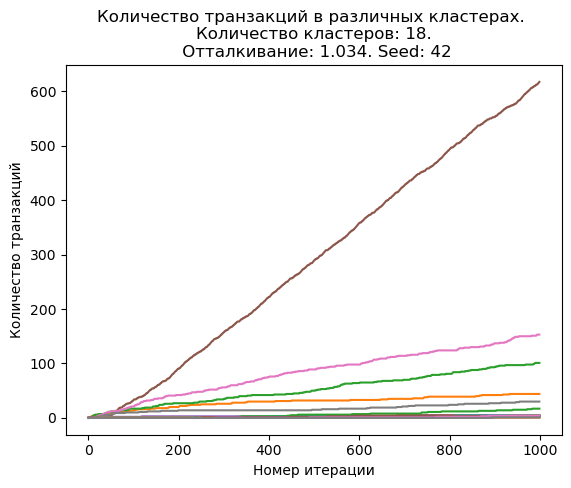

In [8]:
clope.print_history_count(repulsion, seed)

TypeError: get_count_clusters() missing 1 required positional argument: 'target_classes_dict'

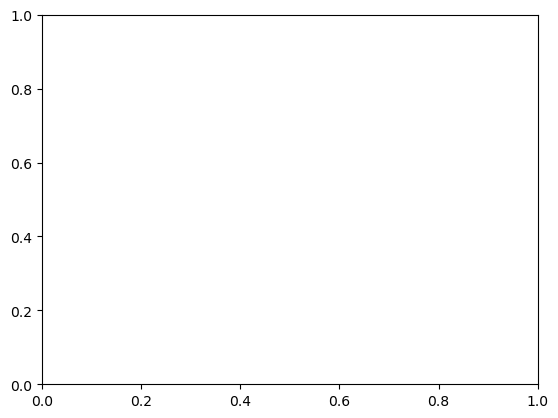

In [27]:
import matplotlib.pyplot as plt

noiseLimit = 0
seed = 42
_, ax = plt.subplots()
linspace = np.hstack((np.arange(1.2, 2.6, 0.2), np.arange(2.6, 3.5, 0.1), np.arange(3.5, 5, 0.5)))
for r in linspace:
    clope = CLOPE(print_step=0, is_save_history=True, random_seed=seed)
    clope.init_clusters(processed_data_dict, r, noiseLimit)
    df = get_count_clusters(clope)
    df['sum'] = df['*'] + df['#,@']
    df = df.sort_values(by='sum')
    ax.plot(list(df['sum']))
plt.title('Вариационные ряды для размера кластера при различных r')
plt.xlabel('Порядковый номер отсортированных по размеру кластеров')
plt.ylabel('Размер кластера')
plt.legend(linspace)
plt.show()

Итерация:  1 . Номер шага 10000 . Число кластеров:  35
Итерация:  1 . Номер шага 20000 . Число кластеров:  35
Итерация:  1 . Номер шага 30000 . Число кластеров:  35
Итерация:  1 . Номер шага 40000 . Число кластеров:  35
Итерация:  1 . Номер шага 50000 . Число кластеров:  35
Итерация:  1 . Номер шага 60000 . Число кластеров:  36
Итерация:  1 . Номер шага 70000 . Число кластеров:  38
Итерация:  1 . Номер шага 80000 . Число кластеров:  40
Итерация:  1 . Номер шага 90000 . Число кластеров:  42
Итерация:  1 . Номер шага 100000 . Число кластеров:  46


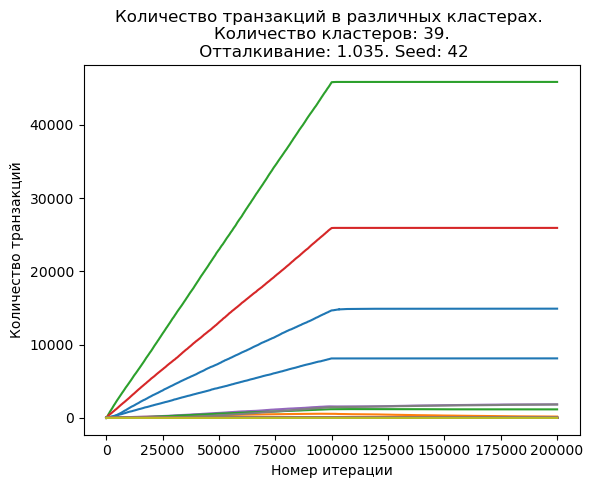

Итерация:  2 . Номер шага 10000 . Число кластеров:  40
Итерация:  2 . Номер шага 20000 . Число кластеров:  40
Итерация:  2 . Номер шага 30000 . Число кластеров:  40
Итерация:  2 . Номер шага 40000 . Число кластеров:  40
Итерация:  2 . Номер шага 50000 . Число кластеров:  43
Итерация:  2 . Номер шага 60000 . Число кластеров:  44
Итерация:  2 . Номер шага 70000 . Число кластеров:  45
Итерация:  2 . Номер шага 80000 . Число кластеров:  45
Итерация:  2 . Номер шага 90000 . Число кластеров:  48
Итерация:  2 . Номер шага 100000 . Число кластеров:  49


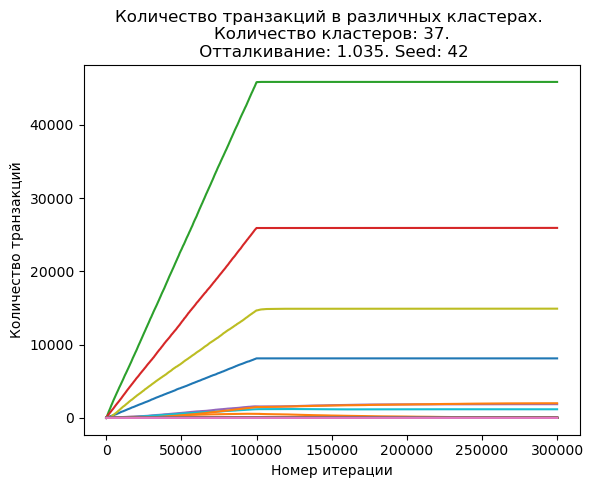

Итерация:  3 . Номер шага 10000 . Число кластеров:  37
Итерация:  3 . Номер шага 20000 . Число кластеров:  38
Итерация:  3 . Номер шага 30000 . Число кластеров:  38
Итерация:  3 . Номер шага 40000 . Число кластеров:  38
Итерация:  3 . Номер шага 50000 . Число кластеров:  39
Итерация:  3 . Номер шага 60000 . Число кластеров:  39
Итерация:  3 . Номер шага 70000 . Число кластеров:  39
Итерация:  3 . Номер шага 80000 . Число кластеров:  40
Итерация:  3 . Номер шага 90000 . Число кластеров:  40
Итерация:  3 . Номер шага 100000 . Число кластеров:  40


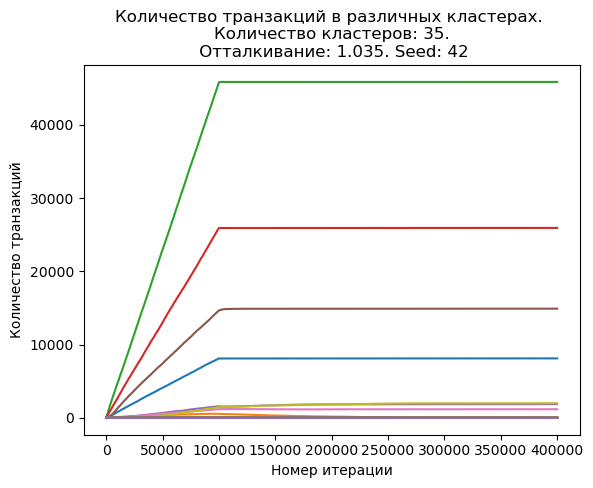

Итерация:  4 . Номер шага 10000 . Число кластеров:  35
Итерация:  4 . Номер шага 20000 . Число кластеров:  35
Итерация:  4 . Номер шага 30000 . Число кластеров:  35
Итерация:  4 . Номер шага 40000 . Число кластеров:  35
Итерация:  4 . Номер шага 50000 . Число кластеров:  35
Итерация:  4 . Номер шага 60000 . Число кластеров:  35
Итерация:  4 . Номер шага 70000 . Число кластеров:  35
Итерация:  4 . Номер шага 80000 . Число кластеров:  35
Итерация:  4 . Номер шага 90000 . Число кластеров:  35
Итерация:  4 . Номер шага 100000 . Число кластеров:  35


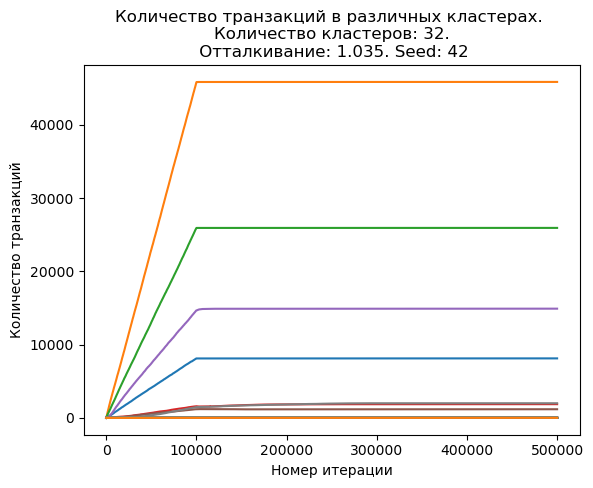

Итерация:  5 . Номер шага 10000 . Число кластеров:  32
Итерация:  5 . Номер шага 20000 . Число кластеров:  32
Итерация:  5 . Номер шага 30000 . Число кластеров:  32
Итерация:  5 . Номер шага 40000 . Число кластеров:  32
Итерация:  5 . Номер шага 50000 . Число кластеров:  32
Итерация:  5 . Номер шага 60000 . Число кластеров:  32
Итерация:  5 . Номер шага 70000 . Число кластеров:  32
Итерация:  5 . Номер шага 80000 . Число кластеров:  32
Итерация:  5 . Номер шага 90000 . Число кластеров:  32
Итерация:  5 . Номер шага 100000 . Число кластеров:  32


In [189]:
while clope.next_step(processed_data_dict, repulsion, noiseLimit) > 0:
    clope.print_history_count(repulsion, seed)

In [218]:
from collections import Counter

def find_mode(clope, target_classes_dict, processed_data_dict):
    mode_dict = {}
    
    # Считаем частоту каждой транзакции для каждого класса
    for itemTransact, cluster in clope.transaction.items():
        target_class = target_classes_dict.get(itemTransact)
        transaction = ", ".join(processed_data_dict[itemTransact])
        
        if target_class:
            if target_class not in mode_dict:
                mode_dict[target_class] = []
            
            mode_dict[target_class].append(transaction)
    
    # Находим моду и ее удельный вес для каждого класса
    for target_class, transactions in mode_dict.items():
        most_common, count = Counter(transactions).most_common(1)[0]
        mode_weight = round(count / len(transactions), 3)  # округляем удельный вес до тысячных
        mode_dict[target_class] = (most_common, mode_weight)
    
    return mode_dict

# Пример использования функции
mode_dict = find_mode(clope, target_classes_dict, processed_data_dict)
len(mode_dict)
mode_dict



{'*': ('6_0', 0.132),
 'n@': ('4f28_0, f3_1', 0.002),
 'd#': ('4f2_0', 0.056),
 'n#': ('6f2_0', 0.03),
 'w@': ('4f18_0, f3_1', 0.004),
 'x@': ('6n_0, 5f3_1', 0.006),
 'd@': ('6n_0, 5b2_1', 0.003),
 '4d': ('6d_0', 0.189),
 'w#': ('4f1_0', 0.043),
 's#': ('6_0', 0.263),
 'x#': ('6f3_0', 0.057),
 'b@': ('6f_0', 0.049),
 'z#': ('6r27_0, f+1_1, f3_2', 0.011),
 'b#': ('6_0', 0.22),
 'r#': ('4_0', 0.145),
 '@': ('4b29_0', 0.006),
 'm#': ('5+_0, r27_1, f3_2', 0.016),
 'f#': ('6_0', 0.226),
 '4n': ('4n_0', 0.217),
 '6n': ('6n_0', 0.218),
 'v#': ('6f27_0, f+1_1, f1_2', 0.015),
 '6d': ('6n_0', 0.209),
 'c6': ('6n_0', 0.308),
 '#': ('6_0', 0.252),
 '5n': ('4n_0', 0.199),
 'l#': ('c4_0, b28_1, f+1_2', 0.029),
 '5d': ('6d_0', 0.173),
 '6w': ('4n_0', 0.202),
 '4w': ('4n_0', 0.215),
 'h#': ('6n_0, 5b29_1, b3_2, b3_3, b2_4, f+1_5, f1_6', 0.036),
 'f@': ('4b27_0', 0.037),
 'z@': ('4+_0, b2_1', 0.111),
 'o#': ('6+_0, b27_1, z3_2, m3_3', 0.2),
 '4x': ('4n_0', 0.302),
 'f*': ('4s_0', 0.136),
 'c4': ('6n_0'

In [224]:
import warnings

# Игнорирование предупреждений PerformanceWarning
warnings.filterwarnings(action='ignore', category=pd.errors.PerformanceWarning)


def add_mode_to_clusters(clope, mode_dict, df):
    new_columns = pd.DataFrame(index=df.index)  # Создаем новый DataFrame для новых столбцов
    
    for target_class, (mode, mode_weight) in mode_dict.items():
        mode_column = f"Mode_of_{target_class}"
        weight_column = f"Mode_Weight_of_{target_class}"
        
        # Инициализация новых столбцов как None
        new_columns[mode_column] = None
        new_columns[weight_column] = None
        
        # Ищем кластер, содержащий моду
        for itemTransact, cluster in clope.transaction.items():
            transaction = ", ".join(processed_data_dict[itemTransact])
            if transaction == mode:
                new_columns.loc[cluster, mode_column] = mode  # Добавляем моду
                new_columns.loc[cluster, weight_column] = round(mode_weight, 3)  # Добавляем удельный вес моды, округленный до тысячных
    
    # Объединяем оригинальный DataFrame с новыми столбцами
    df = pd.concat([df, new_columns], axis=1)
    return df


# Пример использования функции
df_with_modes = add_mode_to_clusters(clope, mode_dict, df)
df_with_modes


,*,"#,@",Mode_of_*,Mode_Weight_of_*,Mode_of_n@,Mode_Weight_of_n@,Mode_of_d#,Mode_Weight_of_d#,Mode_of_n#,Mode_Weight_of_n#,...,Mode_of_5w,Mode_Weight_of_5w,Mode_of_s+2,Mode_Weight_of_s+2,Mode_of_y#,Mode_Weight_of_y#,Mode_of_3,Mode_Weight_of_3,Mode_of_d*,Mode_Weight_of_d*
0,37,2,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,20,1,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,5,14,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
3,32687,4741,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
4,148,16,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
5,1522,426,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
6,37961,1480,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
7,97107,10146,6_0,0.132,"4f28_0, f3_1",0.002,4f2_0,0.056,6f2_0,0.03,...,5d_0,1.0,None,None,None,None,None,None,"6f27_0, b2_1",1.0
8,18767,665,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
9,1,0,None,None,None,None,None,None,None,None,...,5d_0,1.0,None,None,None,None,None,None,None,None


In [ ]:
import pandas as pd
import numpy as np

def add_example_to_clusters(clope, target_classes_dict, processed_data_dict, df):
    example_dict = {}
    
    # Ищем пример для каждого уникального целевого класса
    for itemTransact, cluster in clope.transaction.items():
        target_class = target_classes_dict.get(itemTransact)
        if target_class and target_class not in example_dict:
            example = ", ".join(processed_data_dict[itemTransact])  # Получаем содержимое транзакции
            example_dict[target_class] = (cluster, example)  # сохраняем номер кластера и содержимое транзакции как пример
    
    # Добавляем примеры в DataFrame
    for target_class, (cluster, example) in example_dict.items():
        if f"Example_of_{target_class}" not in df.columns:
            df[f"Example_of_{target_class}"] = np.nan  # Создаем новый столбец с NaN значениями
            df[f"Example_of_{target_class}"] = df[f"Example_of_{target_class}"].astype('object')  # Устанавливаем тип данных столбца как object
        
        df.at[cluster, f"Example_of_{target_class}"] = example  # Используем метод .at[] для присвоения значения, так как он быстрее и менее подвержен ошибкам
    
    return df


# Получаем DataFrame с учетом целевых классов и упорядочиваем его
df = get_count_clusters(clope, target_classes_dict)
df['sum'] = df.sum(axis=1)
df_sorted = df.sort_values(by='sum', ascending=False)
df_sorted = df_sorted.drop(columns=['sum'])

# Добавляем примеры каждого целевого класса в DataFrame
df_with_examples = add_example_to_clusters(clope, target_classes_dict, processed_data_dict, df_sorted)

# Преобразовываем все столбцы с примерами в тип object
example_columns = [col for col in df_with_examples.columns if col.startswith("Example_of_")]
df_with_examples[example_columns] = df_with_examples[example_columns].astype(object)

# Теперь вы можете вывести или анализировать DataFrame с примерами
df_with_examples
